## GP

Gaussian process (GP) is a stochastich process, a non parametric model which assigns a normal distribution to each point. This in turn returns a multivariate normal (MVN) distribution. The difference between a MVN and a GP is that the dimension of the parameters are not fixed for the GP, the covariance matrix is also measured in a very different way. 

$$
\begin{align}
X &\sim \textrm{MVN}(\mu, \Sigma)\\
X &\sim \textrm{GP}(\mu, \mathbb{K})
\end{align}
$$

For the MVN $\mu$ and $\Sigma$ are of fixed dimension. $\Sigma$ represents the covariance matrix in the usual way (Positive definite). For the GP $\mu$ and $\mathbb{K}$ are of variable dimension. $\mathbb{K}$ represent the kernel matrix where 

$$
\mathbb{K}_{ij} = k(x_{i},x_{j})
$$

Instead of the usual covariances we substitute a different similarty measured encapsulated by a kernel function (a different dot product).

## What we did (and why)

We want to use a GP on a simple binary classification problem. So our goal would be to fit our data to a GP, $\{ (X_{1},Y_{1}), \dots, (X_{n}, Y_{n})\}$ where $X_{i} \in \mathbb{R}^{d}$ and $Y_{i} \in \{-1, 1\}$ and 

$$
\begin{align}
f() | \mathbb{K} &\sim \mathrm{GP}(0, \mathbb{K})\\
Y_{i} &\sim Bernoulli(\sigma(f(X_{i})))
\end{align}
$$


So to do some predictions we need to sample for the posterior which is: 

$$
P(Y_{n+1} = 1 | X_{n+1}, X_{1:n}, Y_{1:n}) = \int P(Y_{n+1} = 1 | f(x_{n+1}))P(f(x_{n+1})| X_{1:n}, Y_{1:n})d f(X_{n+1})  
$$

## Why we need a sampler

Which is quite intractable since the product of the prior and the likelihood does not produce a new distribution that we can represent analitically. Why is this a problem? We cant marginalize easily so the integral has a complex structure that we can't evaluate (some integrals are very hard and need numerical methods to approximate). Why can't we just sample from the two distributions that we do have and just do the product of that (like in the EM algorithm)? We can't sample $f()$ for the prior and use that parameter for the likelihood since the dependence occurs simultaneously not in order (the disributions have a strong dependence), we have to sample simultaneously not one by one. So we have to construct a sampler that takes values from the true posterior to recreate the integral.

## Elliptical slice sampler

The elliptical slice sampler samples $f()$ from the posterior distribution which we use to predict the classification of new, unclassified data.

The sampler works by using the property that for fixed data, the GP process is a MVN with the same dimension of the data. $f()| \mathbb{K} \sim \mathrm{MVN}(0, \mathbb{K})$ so the idea is to find new $f'()$ which correspond to our latent variables in such a way that the new $f´()$ deppends on the prior (MVN of dimension n) and the likelihood function of $Y$ (in our case a Bernoulli likelihood function). $Y_{i}| f'() \sim \mathrm{Bernoulli}(\sigma(f'(X_{i})))$ finding the appropriate $f'()$ so we can evaluate $P(Y_{n+1})| X_{n+1}, X_{1:n}, Y_{1:n})$ properly. 

We start with an initialization of f() and judge if this is a good fit for our data, the likelihood function serves to measure how good of a fit $f()$ is to the observed $Y_{1:n}$. We look for a new $f´()$ to see if we can find a better fit, so we search for one in the posterior space. We create an ellipse that passes through our last $f()$ and the ellipse shape and direcction come from a the MVN covariance matrix (our prior). We randomly check a point of that elipse and check if that new point (which represents a draw of the latent variables) provides a better likelihood, if it doesnt we shrink and sample again from the shrunken chunk of the ellipse. 

This way we sample many good representations of our latent variables (one for each of our points) that correspond to high likelihood zones or modes.

Note that the likelihood is dependent on the observed data but the kernel matrix is not, meaning that the $f()$ is not necessarily the same size as the set of $Y_{i}$s. Using this fact we can do predictions (which is what we wanted to do in the first place). How does it work?

## Prediction


Say we separate our data into two types, those of which we have a label of dimension $n \times d$ for and those of which we want to predict the label for of dimension of $m \times d$. Since we are using a GP, the covariance matrix is built using both types, so the GP has a kernel matrix of dimension $n+m \times n+m$. When we run our sampler $f()'$ has a dimension of $n+m \times 1$ meaning that it has a value for all $X$'s irrespective of their labeling. We can still use the likelihood function since the evaluation only considers those data which have a label, meaning that we can still get a best fit, but just for the labeled data. The idea is that use of a similarity measure (kernel functions) will be appropriate for the non labeled data if these are similar in the kernel sense to the labeled data.

## Considerations

We note that the prediction strongly depends on the kernel we choose. The kernel and hyperparameter choice has the ability to impart prior knowledge to the problem at hand. The hyperparameters can be learned using traditional methdos but the kernel selection requieres more nuance. 

To talk about kernels we need to talk about some properties that will facilitate communication:
- The sum of two kernels is a kernel
- The product of two kernel is a kernel

So when we talk about the kernel function that represents a GP we could be talking about many kernel functions that represent properties of the data. Here we mention the combination that we will use:

# Kernels

## Gaussian Noise Kernel

$$
k_{1}(x,x) = \sigma_{1}^{2}I_{n}
$$

The white noise kernel represents independent and identically distributed noise added to the GP distribution. For most problem it is a reasonable assumption that noise is inevitable so adding a noise kernel to a GP is justified.

##  Exponentiated Quadratic Kernel 

$$
k_{2}(x,y) = \sigma_{2}^{2} e^{-\frac{\norm{x-y}^2}{\mathcal{l}^{2}}}
$$

This is a very flexible kernel since it represents the prediction in a smoothed (continuous) way. If the points are similar the quadratic kernel is high and if the points are not so similar the quadratic kernel decays at the speed of a Normal distribution.

For our analysis we will use the kernel $k(x,y) = k_{1}(x,y) + k_{2}(x,y)$.We chose this since it is flexible and doesn't require us to know much about the data before, just that it isn't periodic and doesnt have a linear trend (we are doing classification) so this choice of kernel is a natural starting point. 

In [1]:
#Imports
import sys, time
import matplotlib.pyplot as plt
from matplotlib import colors
import itertools
import numpy as np
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
import scipy

from random import choice
from EllipticalSliceSampler import EllipticalSampler
from gpc import GPC
from scipy.optimize import minimize
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from typing import Callable, Sequence
from utils import *
from tqdm import tqdm
from scipy.stats import multivariate_normal
from numpy.random import multivariate_normal as mn

In [2]:
class EllipticalSampler:
    """
    An Elliptical Slice Sampler, as described in Murray et al. (2010).

    The ESS is an extension of slice sampling (Neal, 2003) that is designed to 
    sample from a posterior distribution in which the prior distribution is a
    Gaussian process. This property holds since log y has a Gaussian process prior. 
    The algorithm is shown to be a competitive alternative to Metropolis-Hastings (Tierney, 1994) 
    for Gaussian process priors, often times working better for real data in terms
    of a larger effective sample size of Monte Carlo output per unit compute 
    time (Murray et al., 2010). Note we allow for non-centered means.

    :param prior_µ: The prior vector mean of the latent features `f`.
    :param prior_Σ: The prior covariance matrix of the latent features `f`.
    :param ll: The observed data log likelihood function.
    """
    def __init__(
        self,
        prior_µ: np.array,
        prior_Σ: np.ndarray,
        ll: Callable,
    ) -> None:
        self.prior_µ, self.prior_Σ, self.ll = prior_µ, prior_Σ, ll
        self.n = len(self.prior_µ)
        self.f_incumbent = mn(self.prior_µ - self.prior_µ, self.prior_Σ, size=1)

    def iteration(self) -> np.ndarray:
        """
        An instance of the ESS, it selects a new location on the randomly generated 
        ellipse (see Murray et al, 2010). There are no rejections: the new state `f`
        is never equal to the current state `f` unless that is the only state on
        the ellipse with non-zero likelihood. The algorithm proposes the angle from a 
        bracket [`θ_min`, `θ_max`] which is shrunk exponentially quickly until an acceptable
        state is found. Thus the step size is effectively adapted on each iteration for
         the current `ν` and `Σ`.

        :return: An accepted proposal, characterized as an n-by-1 array.  
        """
        nu = mn(self.prior_µ - self.prior_µ, self.prior_Σ, size=1)
        log_y = self.ll(self.f_incumbent) + np.log(np.random.uniform(0,1))
        Θ = np.random.uniform(0 + sys.float_info.min, 2*np.pi)
        Θ_min, Θ_max = Θ - 2*np.pi, Θ
    
        while True:
            # try:
            f_candidate = self.f_incumbent * np.cos(Θ) + nu * np.sin(Θ)
            if self.ll(f_candidate) > log_y:
                self.f_incumbent = f_candidate
                return self.f_incumbent.squeeze()
            elif Θ < 0:
                Θ_min = Θ
            elif Θ > 0:
                Θ_max = Θ
            Θ = np.random.uniform(Θ_min, Θ_max)

    def sample(self, num_samples: int, num_burnin: int=0, verbose:int =0):
        """
        Performs `num_samples` iterative runs of the ESS, with the `f` state updated
        between cycles. 

        :return: A stacked array with the posterior samples.  
        """
        disable = True if verbose <=1 else False

        output = [self.iteration() + self.prior_µ for _ in tqdm(range(num_samples), disable=disable)]
        if num_burnin>0:
            output = output[num_burnin:]
        return np.stack(output)

In [3]:
class GPC():
    '''
    A Gaussian Process Classifier class.
    '''
    def __init__(
        self, 
        kernel:Callable, 
        hyperparameters:Sequence, 
        hyperparameter_names: Sequence = [],
        optimizer:str = "L-BFGS-B"
    ):
        '''
        Args:
            kernel: A kernel function that takes three arguments: X, Y, hyperparameters. 
                hyperparameters should be a list of kernel parameters.
            hyperparameters: A sequence of hyperparmaeters that correspond to the kernel argument.
            hyperparameter_names[optional]: Names of the hyperparameters.
            optimizer[optional]: optimizer by scipy.optimize.minimize to fit the model. 
        '''
        self.kernel= kernel
        self.hyperparameters = hyperparameters
        self.hyperparameters_names = hyperparameter_names

        self.X = None
        self.Y = None
        self.nll = None
        self.optimizer = optimizer

    def _check_is_fitted(self) -> None:
        assert self.X is not None, "There is no data loaded, please fit the model by calling the fit method."

    def _update_hyperparameters(self, hyperparameters) -> None:
        '''Updates hyperparameters of kernel'''
        assert len(hyperparameters) == len(self.hyperparameters), \
            f"Incorrect number of hyperparameters. Expected {len(self.hyperparameters)} instead got {len(hyperparameters)}"
        self.hyperparameters = hyperparameters

    def _get_mu(self, X):
        '''Returns a mean vector of zeros'''
        return np.zeros(len(X))

    def _get_sigma(self, X:np.ndarray, hyperparameters:Sequence = []):
        '''Returns a variance covariance matrix using the specified kernel and hyperparameters. if no hyperparameters are
        specified then uses the class hyperparameters.'''

        if hyperparameters == []:
            hyperparameters = self.hyperparameters

        n = len(X)
        gram_matrix = np.array([np.zeros(n) for _ in range(n)])
        for i, j in itertools.product(range(n), range(n)):
            gram_matrix[i][j] = self.kernel(X[i], X[j], hyperparameters)
        min_eig = np.min(np.real(np.linalg.eigvals(gram_matrix)))
        if min_eig <0:
            gram_matrix -= 10*min_eig * np.eye(*gram_matrix.shape)

        return gram_matrix + 1e-12 * np.identity(n)
    
    def _sigmoid(self, f):
        return 1/(1 + np.exp(-f))

    def _list_to_array(self, x:Sequence):
        if not isinstance(x, np.ndarray):
            x = np.array(x)
        return x

    def _loglikelihood(self, Y, f) -> float:
        '''
        Returns the log likelihood for a binary classification model
        Args:
            Y: Binary labels
            f: Logits (draw from gaussian process)
        '''
        
        f = f.reshape(1, -1)
        Y = self._list_to_array(Y).reshape(1, -1)

        return np.sum([
            np.log(self._sigmoid(f_i)) if y == 1 
            else np.log(self._sigmoid(-f_i)) 
            for f_i, y in zip(f.squeeze().tolist(), Y.squeeze().tolist())
            ])

    def sample_prior(self, X, num_samples:int) -> Sequence:
        '''Draw num_samples from the prior'''
        return np.random.multivariate_normal(self._get_mu(X), self._get_sigma(X), num_samples)
    
    def sample_posterior(self, X, Y, num_burnin:int = 100, num_samples:int = 300, verbose=0, **kwargs) -> Sequence:
        '''Draws num_samples from posterior and discards the first num_burnin samples.'''
        assert num_samples > num_burnin, f"Got {num_samples} but required to burn {num_burnin} samples"

        def log_likelihood(f):
            if len(Y) < len(f): f = f[:len(Y)]
            return self._loglikelihood(Y=Y, f=f)

        ess = EllipticalSampler(self._get_mu(X), self._get_sigma(X,**kwargs), log_likelihood)
        return ess.sample(num_samples, num_burnin, verbose=verbose)

    def posterior_mean(self, X, Y, verbose=0, **kwargs) -> Sequence:
        '''Returns posterior mean'''
        return np.mean(self.sample_posterior(X, Y, verbose=verbose, **kwargs), axis=0)

    def fit(self, X, y, maxiter:int = 100, eps:float = 1e-3, tol:float = 1e-7, verbose=0, **kwargs) -> None:
        '''
        Fits the model and finds the optimal hyperparameters
        
        Args:
            maxiter: max iterations for the optimizer
            eps: step size for the optimizer
            tol: threshold change in the log likelihood for convergence
            verbose: 1 shows the hyperparameters as it updates, 2 also shows progress bar for sampler.
        '''
        self.X = X
        self.Y = y

        def nll(hyperparameters):
            neg_loglikelihood = -1 * self._loglikelihood(Y=self.Y, f=self.posterior_mean(self.X, self.Y, hyperparameters=hyperparameters, **kwargs))
            if verbose >= 1:
                print(f"Neg log likelihood is {neg_loglikelihood}")
            return neg_loglikelihood

        def callback(parameters):
            if verbose >= 1:
                if len(self.hyperparameters_names) == len(parameters):
                    parameter_strings = [str(round(p, 4)) for p in parameters]
                    output = [": ".join(name_param) for name_param in zip(self.hyperparameters_names, parameter_strings)]
                    print(" ".join(output))
                else:
                    print(parameters)

        res = minimize(
            nll, 
            self.hyperparameters, 
            method=self.optimizer, 
            options={"maxiter":maxiter, "ftol": tol, "eps": eps}, 
            callback=callback)
        self._update_hyperparameters(res.x)
        self.nll = res.fun
        print(f"Fitted with final hyperparameters: {self.hyperparameters} and neg log likelihood {res.fun}")
    
    def sample_posterior_predictions(self, X, verbose=0, **kwargs) -> Sequence:
        '''Draws posterior prediction samples by concatenating the new X's with the X's that the model was fitted on.
        returns samples that are n + t x 1 where n is the lenght of the training data and t is the length of the new data
        pass num_samples or num_burnin to the sample posterior method through kwargs
        '''
        self._check_is_fitted()
        X = np.concatenate((self.X, X))
        return self.sample_posterior(X, self.Y, verbose=verbose, **kwargs)


    def predict(self, X, verbose=0, **kwargs) -> float:
        '''Predict function with kwargs being passed to sample_posterior'''
        self._check_is_fitted()
        X = np.concatenate((self.X, X))
        samples = self.sample_posterior(X, self.Y, verbose=verbose, **kwargs)[:, self.X.shape[0]:]
        return np.mean(samples, axis=0), np.var(samples, axis=0)

### Class Implementation: The Good, The Bad & The Ugly
Above is our Gaussian process classifier class that we implemented to use for the implemented slice sampler. It's main functions are sample from the posterior, sampling from the prior fitting, and predicting. To instantiate the class we pass it a kernel function and a list of hyperparameters that definte our gaussian process classifier. The implicit model is a simple binary classification model as we have already described. 

Sampling from the prior is a simple function that draws from the multivariate normal by calling the _get_mu and _get_sigma function which generate a mean vector of zeros and a covariance matrix using the kernel and the X data passed to the function. 

To sample from the posterior we had to first define the log likelihood function, and in particular we define it so that the Y's are fixed and it only accepts a draw f from the posterior distribution. Then we are able to pass this log likelihood function and a prior mean and prior covariance to the elliptical slice sampler which gives us a number of posterior samples. This allows us to draw posterior samples using our pre-defined hyper parameters of the kernel. 

The fit function uses an optimizer (and in this case we use L-BFGS-B) to search for the optimal hyperparameters. In a Bayesian setting we might put priors on the hyper parameters but trying to integrate over such a massive model would be impossible. Instead here, scipy will use optimization routines to numerically approximate the gradient and try to run gradient descent essentially. First we have to redefine our log likelihood function to be a function of the hyperparameters. We do this by defining it as computing the likelihood of the posterior mean (from using the elliptical slice sampler) and certain prior hyperparameters. We change this to negative log likelihood as optimizers typically minimize instead of maximize. 

Here we began to run into many problems trying to optimize this function. From a practical point of view when implementing it is very hard to find out if you have implemented something wrong with your model or it is the data that is making it difficult or simply that the convergence is very slow. For a long time we were unsure and one of our main recommendations, especially when working with a black box optimzier, is to try to make the outputs more verbose. So here we implement a callback function that allows us to watch the hyperparameters change at each iteration. This was in fact not sufficient as we could not observe each function evaluation. This comes from understanding how the optimizer works and understanding that we needed to see each negative log likelihood evaluation to get better diagnostics. A simple print statement in the negative log likelihood method made an incredible difference. After being able to see into this inner loop of the optimizer we realized that it might be the step size that was causing either divergence or very slow convergence. By doing this we could adjust the step size to somethign that works much better and as well that works much faster as this is incredibly important for something that must run the slice sampler many many times. 

When we were adjusting the step size we noticed a problem with the covariance matrix that ended up being not positive semi definite. From theory we know that this is impossible when you use a valid kernel function. So we know this has to due with numerical issues with floating point numbers. At first we used a small number added to the diagonal of the gram matrix, but this did not solve it as theory would suggest and in fact this is a common trick many practitioners use to help with numerical stability but here it was not enough. Finally, we decided to truncate the decimals of the covariance matrix using the minimum value among the eigenvalues. Since this value should be zero, in case we encountered values that diverged from this we knew that floating point errors where occurring. The final solution ended up being a substraction of this minimum value from all the components of the matrix that where not placed in the main diagonal. This in the end solves all our implementation problems.

Finally we have a predict method that concatenates new samples of X and generates a larger covariance matrix which we use to draw posterior samples with using our fitted hyper parameters. Below we create a toy classification example that is easily separable and has two features to understand how this all works. We further generate some out of bounds data that are outside of our normal training sample.

### Toy examples
This section presents mock examples to highlight some of the behavior our elliptical slice sampler exhibits, as well as to show the predictive performance of the sampler under baseline kernels and hyperparameters for both 1D and 2D Gaussian examples.  

#### Toy Example: Elliptical Slice Sampler

We define a vector $\mathbf{f} \sim \mathcal{N}(\mu^{prior},\Sigma^{prior})$ and a likelihood $L(\mathbf{f})=p($ data $\mid \mathbf{f})$, which for convenience we choose to follow another Gaussian distribution with the same prior parameters. While overly simplistic, we are able to easily compute the analytic posterior parameters of our latent $\mathbf{f}$. The arbitrary set of prior parameters writes

$$
\mu^{prior} = \left[\begin{array}{c}
1  \\
2
\end{array}\right] \quad \quad \quad \quad \quad \quad \quad 
\Sigma^{prior} \approx 
\left[\begin{array}{cc}
2.58 & -0.67  \\
-0.67 & 1.09
\end{array}\right]
$$

In order to test the performance of our elliptical slice sampler, we will present here some of the steps internal to the function, and we will visualize its performance. 

In [4]:
np.random.seed(32)
prior_µ = np.array([1,2])
prior_Σ = np.array(
    [[ 2.58319407, -0.67001488],
    [-0.67001488,  1.09846023]]
)

Unlike in our main classification application, the likelihood function here corresponds to that of a Gaussian:

In [5]:
loglik = lambda f: np.log(multivariate_normal.pdf(f, mean=prior_µ, cov=prior_Σ))

The first draw of $\mathbf{f}$ in the elliptical slice sampler is a particular draw from a multivariate normal with our defined priors, while subsequent iterations will use the accepted candidates as incumbent values for $\mathbf{f}$. Similarly, we draw a value for $\nu$ from a multivariate normal with parameters set by our priors. 

In [6]:
f_incumbent = (mn(prior_µ - prior_µ, prior_Σ, size=1)).squeeze()
nu = mn(prior_µ - prior_µ, prior_Σ, size=1)

The slice sampling will then select a location (a candidate $\mathbf{f}$) on a randomly generated ellipse. To determine our candidate location, we define an angle $\theta$ drawn as $\theta \sim \mathcal{U}[0,2\pi]$. We further bound future choices of $\theta$ to fall within a bracket $[\theta - 2\pi, \theta]$, from which we make uniform draws if the first candidate $\mathbf{f}$ is not selected.

In [7]:
Θ = np.random.uniform(0 + sys.float_info.min, 2*np.pi)
Θ_min, Θ_max = Θ - 2*np.pi, Θ

In order to decide whether to accept the candidate, we define $\log y$, which comprises the likelihood of the incumbent $\mathbf{f}$ and some negative parameter drawn from a uniform. We will compare the likelihood of the candidate to $\log y$, and we will accept if it is larger.

In [8]:
log_y = loglik(f_incumbent) + np.log(np.random.uniform(0,1))

Having defined the initial parameters, we can now repeatedly consider different candidates until accepting a new $\mathbf{f}$. The algorithm is adaptive: it will shrink the regions of the ellipse eligible for evaluation following failure to reject a candidate, so that in the worst case scenario we select the incumbent $\mathbf{f}$ itself. Note that the shrinking of the eligible $\theta$ will depend on whether the previous value was positive or negative.

We will run a first simulation of the ESS, drawing the eligible area of the ellipse (black if eligible, gray if not) as well as those regions that, if evaluated, would lead to acceptance of a new $\mathbf{f}$ (green). We consider $f_t$ to be the incumbent value for $\mathbf{f}$, and $f_{t+1}$ to be the candidate. Recall this candidate is drawn as

$$
\mathbf{f}_{t+1}=\boldsymbol{\nu}_t \sin \theta_{t+1}+\mathbf{f}_t \cos \theta_{t+1}
$$

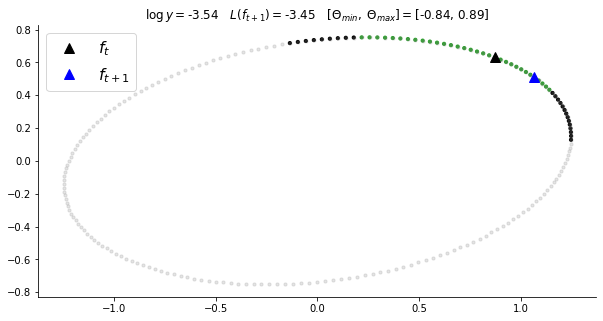

In [9]:
first, i = True, 0
while True:
    i+=1
    # Define candidate
    f_candidate = (f_incumbent * np.cos(Θ) + nu * np.sin(Θ)).squeeze()

    plot_ESS(log_y, f_incumbent, f_candidate, Θ_min, Θ_max, nu, loglik, first=first, save=False, i=i, figsize=(10,5))
    time.sleep(1)
    if loglik(f_candidate) > log_y:
        f_incumbent = f_candidate
        break
    elif Θ < 0:
        Θ_min = Θ
    elif Θ > 0:
        Θ_max = Θ
    first=False
    Θ = np.random.uniform(Θ_min, Θ_max)

### Drawing posteriors

The advantage of using a Gaussian likelihood is that we are able to test whether we approximate the analytical solution of the posterior distribution, thus providing reassuring evidence that our slice sampler works as expected. Let's instantiate the class that we define in a standalone script <code>EllipticalSliceSampler.py</code>, and repeat the process above $10000$ times. We will burn out the first $1000$ observations.

In [10]:
ess = EllipticalSampler(prior_μ=prior_μ, prior_Σ=prior_Σ, ll=loglik)
draws = ess.sample(num_samples=10000, num_burnin=1000, verbose=2)

100%|██████████| 10000/10000 [00:11<00:00, 864.76it/s]


Given our multivariate normal with normal-distributed latent parameter $\mathbf{f}$, we can define the analytical solution to the posterior $\Sigma$ as

$$
\Sigma^{post} = \Sigma^{prior} \cdot \left(\Sigma^{prior} + \Sigma^{\mathbf{f}}\right)^{-1} \cdot \Sigma^{\mathbf{f}}
$$

In [11]:
post_Σ = prior_Σ @ scipy.linalg.inv(2*prior_Σ) @ prior_Σ

# Posterior using analytical solution
print(post_Σ)

[[ 1.29159703 -0.33500744]
 [-0.33500744  0.54923011]]


We can now create the covariance matrix of our posterior samples, and check whether it is approximately similar to the analytical posterior covariance matrix.

In [12]:
np.cov(draws.T).tolist()

[[1.3243419046719287, -0.3299077468962936],
 [-0.3299077468962936, 0.553353573916692]]

We can further visualize these results, and test the convergence of the posterior $\Sigma$ to the analytical solution.

In [13]:
# Demean posterior observations
plot_draws = np.subtract(draws, np.mean(draws.T, axis=1))

# Draw topography for the analytical standard deviation
basespace = np.linspace(0,2*np.pi, 200)
points = np.array([np.cos(basespace),np.sin(basespace)])
sd_ellipse = np.linalg.cholesky(np.cov(draws.T)) @ points
sd2_ellipse = 2 * np.linalg.cholesky(np.cov(draws.T)) @ points

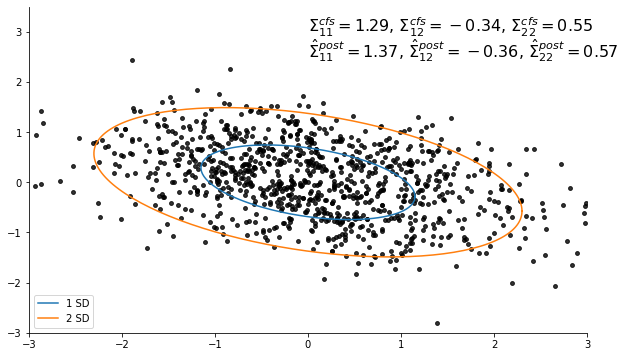

In [14]:
for i in range(20):
    data = plot_draws[:(i+1)*50]
    plot_live(data, prior_Σ, sd_ellipse, sd2_ellipse)
    time.sleep(0.5)

These results are reassuring, and suggest we are indeed approximating the theoretical posterior distribution of $\mathbf{f}$ using our hand-coded Elliptical Slice Sampling.

### Toy Example: 2D GPC

In an additional mock application, we consider the binary classification of nearly-linearly separable observations defined in a two dimensional space. We aim to show that our Gaussian Process classifier is able to both return good point estimates on the out-of-sample predictions as well as capture the relative uncertainty embedded in the data. 

Let's define our somewhat arbitrary data.

In [15]:
X1 = np.random.standard_normal(size=100)
X2 = np.random.normal(0,3,size=100)
X = np.dstack((X1,X2)).squeeze()
Y = np.where(0.5*X1 + 0.3*X2 + np.random.normal(0,0.2,100) > 0, 1, 0)

And let us also plot it.

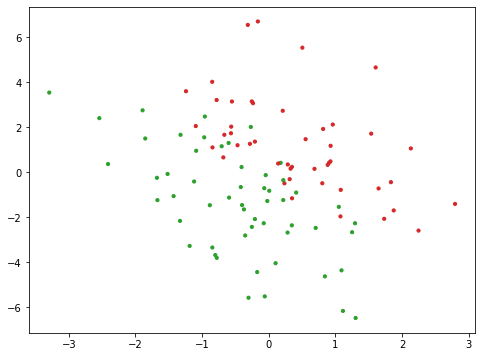

In [16]:
fig, ax = plt.subplots(1,1,figsize=(8,6))
plt.scatter(x=X[:,0], y=X[:,1], s=10, c=np.where(Y>0, "tab:red", "tab:green"))

We will split our dataset in 80 training observations and a held-out sample with 20 data points. 

In [17]:
train_X, train_Y = X[:80,:], Y[:80]
test_X, test_Y = X[80:,:], Y[80:]

We create an instance of our Gaussian Process Classifier, and define baseline $\sigma^2$ and $l$ hyperparameters of a Gaussian kernel as $[1,1]$. We will first predict using these values, and will then test whether we can improve our accuracy and prediction certainty by fine-tuning the kernel hyperparameters.

In [18]:
gpc = GPC(kernel=gaussian_kernel, hyperparameters=[1,1])
gpc.X, gpc.Y = train_X, train_Y

We use the <code>predict</code> method of the Gaussian Process Classifier class to draw predictions on the out-of-sample observations.

In [19]:
y_pred, _ = gpc.predict(test_X)
prob_pred = sigmoid(y_pred)

Let's plot our results. We also generate a contour plot to capture the topography of the uncertainty embedded in the data and captured by the model.

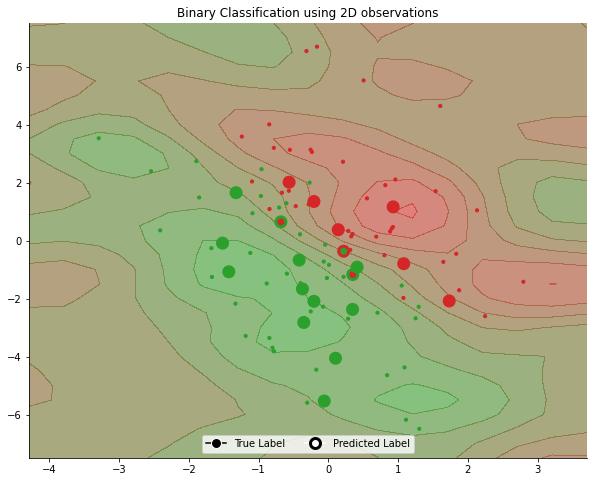

In [20]:
plot_contour(train_X, train_Y, test_X, test_Y, prob_pred, gpc, contour=True)

We can now optimize the hyperparameters of the kernel function using our in-sample observations, which ought to improve the performance of the model, as we will showcase in the 1D example below.

In [21]:
gpc.fit(train_X, train_Y, verbose=0, tol = 1e-1, eps = 1)

C:\Users\David\AppData\Local\Temp\ipykernel_30680\426242507.py:46: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if hyperparameters == []:


Fitted with final hyperparameters: [1.89600084 1.44405235] and neg log likelihood 25.154687718267418


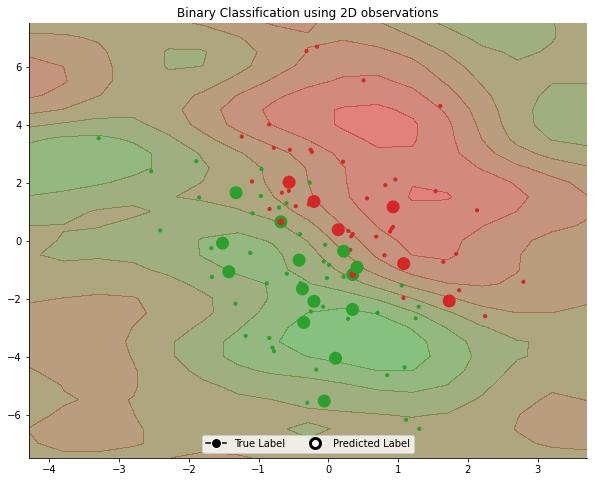

In [22]:
y_pred_fit, _ = gpc.predict(test_X)
prob_pred_fit = sigmoid(y_pred_fit)

plot_contour(train_X, train_Y, test_X, test_Y, prob_pred_fit, gpc, contour=True)

While the previous results were already promising, classifying with optimized kernel hyperparameters yields minor improvements in this very basic example. 

In [24]:
from sklearn.metrics import roc_auc_score

print("Unfitted Model - ROC AUC Score = ", roc_auc_score(test_Y, sigmoid(y_pred)))
print("Fitted Model - ROC AUC Score = ", roc_auc_score(test_Y, sigmoid(y_pred_fit)))

Unfitted Model - ROC AUC Score =  0.90625
Fitted Model - ROC AUC Score =  0.9375


### Toy Example: 1D GPC

In [23]:
np.random.seed(0)
X, Y = make_classification(n_samples = 40, n_features=2, n_redundant=0, class_sep=5, random_state=0)
x, x_test, y, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

tol1 = 1e-1
eps1 = 1e-4
tol2 = 1e-1
eps2 = 1
num_samples = 150

def gen_outofbounds_x(x, num_samples, step):
    oob_x = []
    for dim in range(x.shape[1]):
        min_x = np.array([np.min(x[:,dim]) - (i + 1) * step for i in range(num_samples)]) 
        max_x = np.array([np.max(x[:,dim]) + (i + 1) * step for i in range(num_samples)]) 
        x_dim = np.concatenate((min_x, max_x))
        oob_x.append(x_dim)
    return np.vstack(oob_x).T

new_x = gen_outofbounds_x(x, 10, 0.5)

Here we make four sets of samples. We first draw prior samples, then draw posterior samples and then draw two sets of fitted posterior samples using a poor step size and a good step size

In [24]:
gpc = GPC(gaussian_kernel, [1, 1])

prior_samples = gpc.sample_prior(x, num_samples - 100)
posterior_samples = gpc.sample_posterior(x, y, num_samples = num_samples)

gpc1 = GPC(gaussian_kernel, [1,1])
gpc1.fit(x, y, verbose=1, tol=tol1, eps=eps1)
fitted_samples = gpc1.sample_posterior(x, y, num_samples = num_samples)
print(gpc1.hyperparameters)


gpc2 = GPC(gaussian_kernel, [1,1])
gpc2.fit(x, y, verbose=1, tol=tol2, eps=eps2)
fitted_samples2 = gpc2.sample_posterior(x, y, num_samples=num_samples)
print(gpc2.hyperparameters)

/var/folders/fq/n5tgcfd17f95_157_r7r9xnc0000gn/T/ipykernel_26449/426242507.py:46: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if hyperparameters == []:


Neg log likelihood is 8.900070917598326
Neg log likelihood is 8.323450093558268
Neg log likelihood is 7.7109358880265635
Neg log likelihood is 6.531544825903579
Neg log likelihood is 5.3398232347357935
Neg log likelihood is 5.264276206987349
Neg log likelihood is 8.272492066771322
Neg log likelihood is 7.850093641423949
Neg log likelihood is 8.12127102494404
Neg log likelihood is 7.68189761497391
Neg log likelihood is 8.193417423262273
Neg log likelihood is 8.616107593040166
[1.02468026 1.05089682]
Neg log likelihood is 7.833253697595332
Neg log likelihood is 8.758231571375624
Neg log likelihood is 8.532648221401459
Neg log likelihood is 8.667756778636758
Neg log likelihood is 8.803454742882378
Neg log likelihood is 9.011246739655002
Neg log likelihood is 8.711752643367134
Neg log likelihood is 9.376167251722194
Neg log likelihood is 8.213938414821506
Neg log likelihood is 8.579355430209429
Neg log likelihood is 8.913209018767803
Neg log likelihood is 9.692728880622855
Neg log likeliho

We can watch the verbose output as we fit and notice how the step size when it is set poorly does not manage to move the log likelihood as it is not able to explore far enough relative to the gradients of the log likelihood. Below we generate some posterior samples and save some variables for plotting

In [25]:
models = [gpc, gpc, gpc1, gpc2]

titles = [
    "Prior Samples",
    "Posterior Samples",
    f"Fitted Samples tol={tol1} eps={eps1}",
    f"Fitted samples tol={tol2} eps = {eps2}"
]

samples = [
    prior_samples, 
    posterior_samples,
    fitted_samples,
    fitted_samples2
]

predictions_samples = [
    gpc.sample_prior(np.vstack([x, x_test]), num_samples=num_samples- 100),
    gpc.sample_posterior(np.vstack([x, x_test]), y, num_samples=num_samples),
    gpc1.sample_posterior_predictions(x_test, num_samples=num_samples),
    gpc2.sample_posterior_predictions(x_test, num_samples=num_samples)
]

hyperparameters = [
    [round(p, 3) for p in model.hyperparameters] 
    for model in models
]

nlls = [
    round(np.mean([- model._loglikelihood(y, s) for s in sample]), 3)
    for model, sample in zip(models, samples)
]

Here we plot the fits for our model. We can see everything we would expect. The prior samples simple show a gaussian kernel that sits at the mean, especially when there is no information. It only encodes the covariance matrix and does not take advantage of the likelihood of the data. The posterior sample fits to the data more so than the prior as we would expect. Notice that the fitted sample using a step size of 1e-4 does not work and the negative log likelihood is more or less unchanged, but if we use a proper step size of 1 then we are able to fit better hyper parameters for the kernel. If we look at the first figure which plots along the first dimension of the design matrix we might wonder why bother with optimizing. We could have just looked at the data and intuited that we would have want a high length scale to smooth the gaussian kernel and a relatively low variance and we would have gotten a good fit. Notice actually that the hyperparameters (shown as variance then length scale) use a rather high variance as well which is counter intuitive. The reason is evident when we look at the second dimension. The data is not as obviously separable and we see why we needed a high variance to fit. Finally, we can see that the model has a lot of uncertainty where there is not data. This is of course a toy example, but shows how we would have no hope of simply visually guessing the good hyper parameters if the dimension of x were larger or the kernels were more complicated. This motivates the use of the blackbox optimizer. 

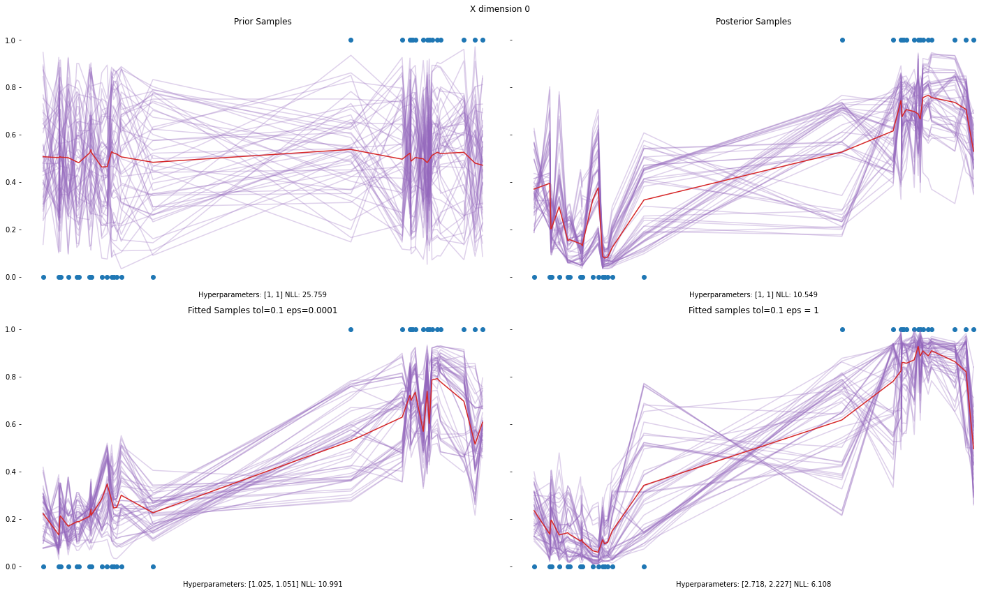

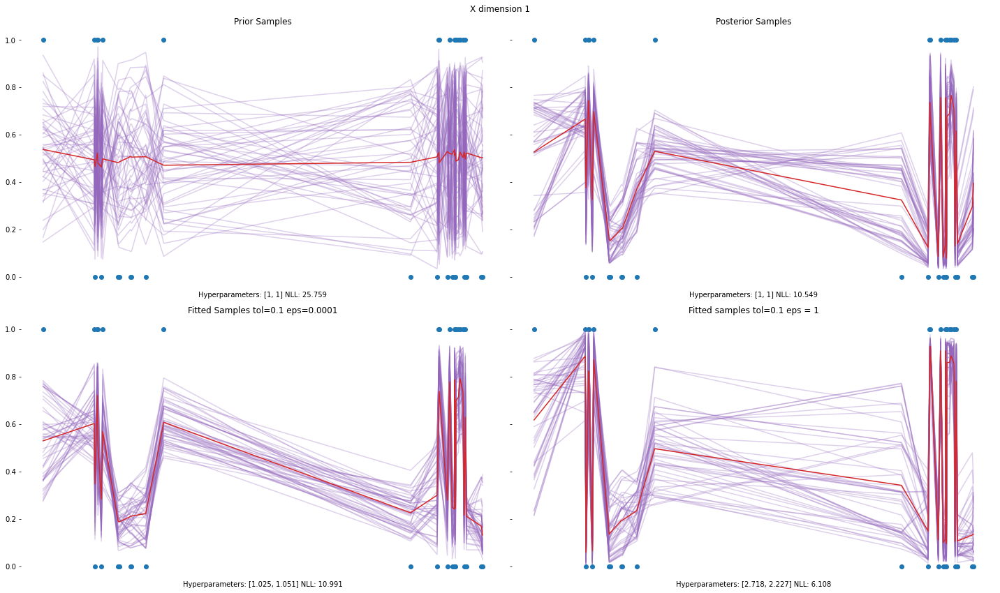

In [26]:
def plot_example(x_dim, x, y, titles, samples, x_test = None, y_test = None):
    fig, axs = plt.subplots(2, 2, figsize=(20, 12), sharey=True, tight_layout=True)
    for i, ax in enumerate(axs.ravel()):
        if x_test is not None:
            if y_test is not None:
                ax.scatter(x_test[:, x_dim], y_test, color="black")
            x_stack = np.vstack([x, x_test])
            plot_gp_samples(x_stack, samples[i], ax=ax, x_dim=x_dim)
        else:
            plot_gp_samples(x, samples[i], ax=ax, x_dim=x_dim)
        ax.set_title(titles[i])
        ax.set_xlabel(f"Hyperparameters: {hyperparameters[i]} NLL: {nlls[i]}")
        for spine in ["top", "bottom", "right", "left"]:
            ax.spines[spine].set_visible(False)
        ax.set_xticks([])
        ax.scatter(x[:,x_dim], y, color="tab:blue")
    fig.suptitle(f"X dimension {x_dim}")
    return fig

fig = plot_example(0, x, y, titles, samples)

fig2 = plot_example(1, x, y, titles, samples)

Here we plot some held out sample predictions. Because of the nature of classification it is hard to see the use of the gaussian process and its uncertainty quantifications. The test points are in black and although the above plots might have had you thinking that there is some overfitting, actually we can see below that our predictions are fairly accurate for this test data. We can see that the fitted sample also predicts more accurately than the unfitted simple posterior draws. 

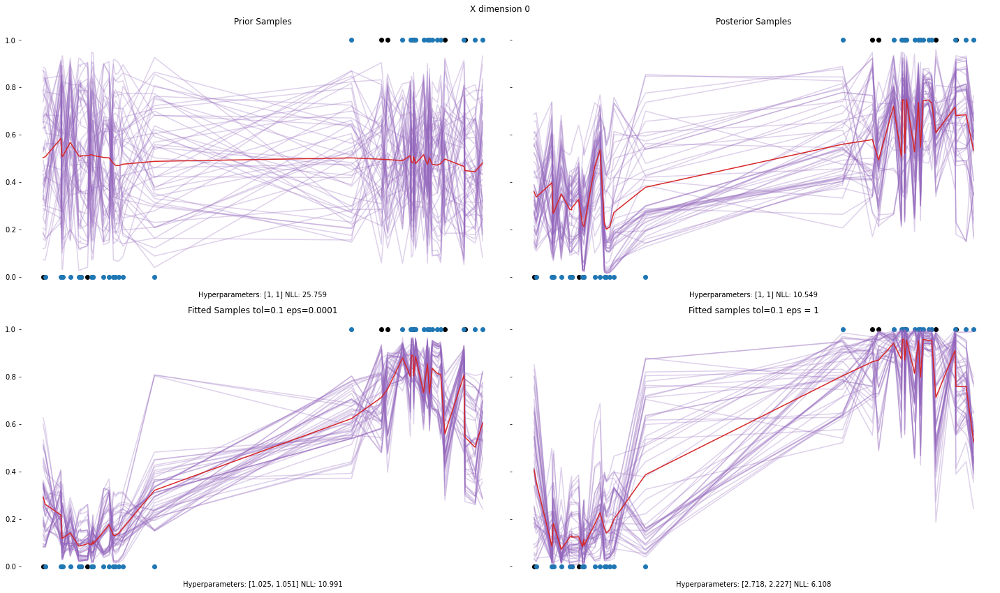

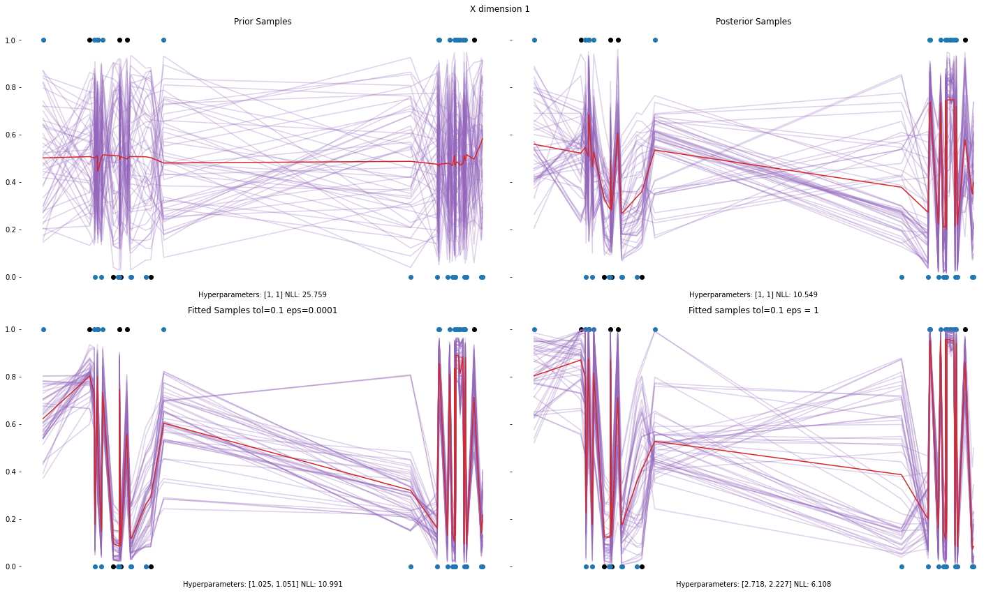

In [27]:
pred_fig = plot_example(
    0, 
    x, 
    y,
    titles, 
    predictions_samples,
    x_test,
    y_test
)

pred_fig2 = plot_example(
    1, 
    x,
    y,
    titles, 
    predictions_samples,
    x_test,
    y_test
)

Here we can quickly look at the accuracy and mse for the eight test points and see that although every one classifies correctly, but we have lower MSE when the model is properly fitted. 

In [28]:
def pred_labels(pred_samples, n_train):
    point_preds = sigmoid(np.mean(pred_samples, axis=0)[n_train:])
    pred_labels = [1 if pred >= 0.5 else 0 for pred in point_preds]
    return pred_labels, point_preds

y_preds= [pred_labels(pred_sample, len(x)) for pred_sample in predictions_samples]
y_labels, y_probas = zip(*y_preds)

for title, y_pred, y_proba in zip(titles, y_labels, y_probas):
    accuracy = 1 -  np.sum(np.abs((np.array(y_pred) - y_test)))/len(y_test)
    mse = np.mean((np.array(y_proba) - y_test)**2)
    print(f"{title} had accuracy {accuracy} and mse {mse}")

Prior Samples had accuracy 0.25 and mse 0.2598652403949629
Posterior Samples had accuracy 0.875 and mse 0.1439295314790769
Fitted Samples tol=0.1 eps=0.0001 had accuracy 1.0 and mse 0.07906386490555357
Fitted samples tol=0.1 eps = 1 had accuracy 1.0 and mse 0.030992751298589288


Finally we draw some sample predictions on our out of sample data. 

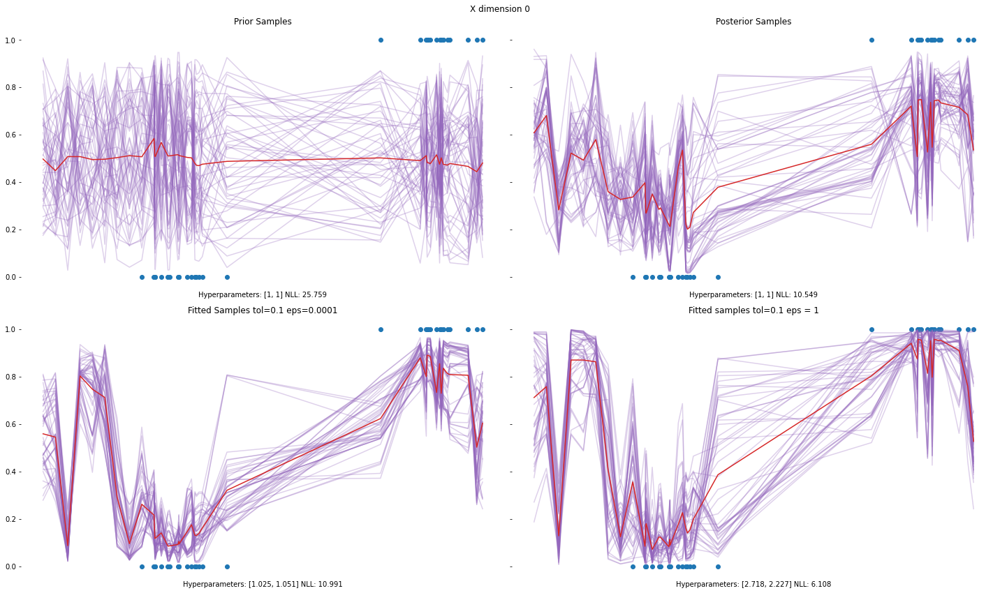

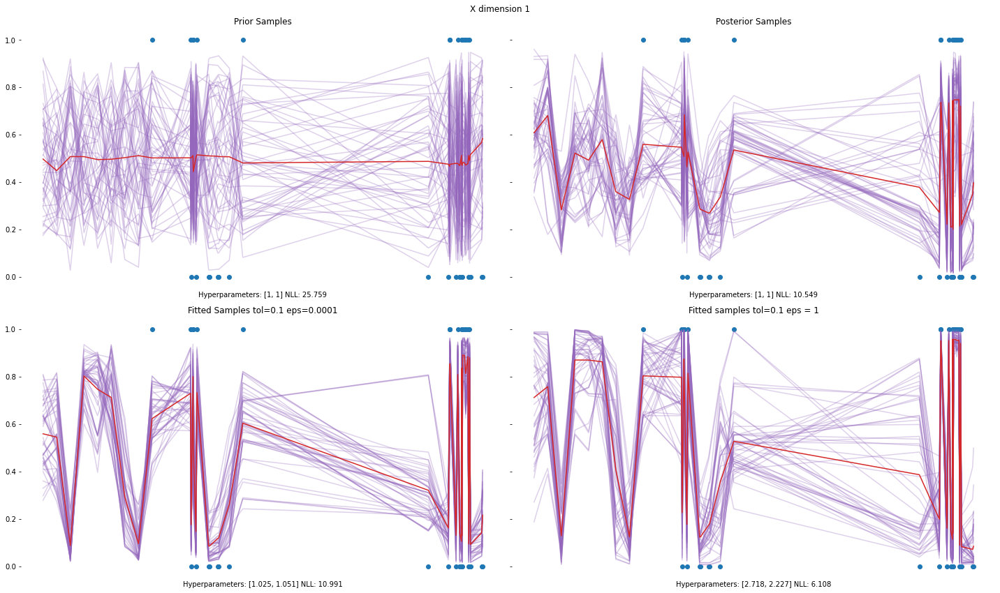

In [29]:
pred_fig_oob1 = plot_example(
    0, 
    x, 
    y,
    titles, 
    predictions_samples,
    new_x
)

pred_fig_oob2 = plot_example(
    1, 
    x,
    y,
    titles, 
    predictions_samples,
    new_x
)

## The Dataset - Heart Failure

[Source](https://www.kaggle.com/fedesoriano/heart-failure-prediction)

### Context
Cardiovascular diseases (CVDs) are the number 1 cause of death globally, taking an estimated 17.9 million lives each year, which accounts for 31% of all deaths worldwide. Four out of 5CVD deaths are due to heart attacks and strokes, and one-third of these deaths occur prematurely in people under 70 years of age. Heart failure is a common event caused by CVDs and this dataset contains 11 features that can be used to predict a possible heart disease.

People with cardiovascular disease or who are at high cardiovascular risk (due to the presence of one or more risk factors such as hypertension, diabetes, hyperlipidaemia or already established disease) need early detection and management wherein a machine learning model can be of great help.

### Attribute Information
<ul>
<li>Age: age of the patient [years]</li> 
<li>Sex: sex of the patient [M: Male, F: Female]</li>
<li>ChestPainType: chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]</li> 
<li>RestingBP: resting blood pressure [mm Hg]</li> 
<li>Cholesterol: serum cholesterol [mm/dl]</li> 
<li>FastingBS: fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]</li> 
<li>RestingECG: resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]</li> 
<li>MaxHR: maximum heart rate achieved [Numeric value between 60 and 202]</li> 
<li>ExerciseAngina: exercise-induced angina [Y: Yes, N: No]</li> 
<li>Oldpeak: oldpeak = ST [Numeric value measured in depression]</li> 
<li>ST_Slope: the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]</li> 
<li>HeartDisease: output class [1: heart disease, 0: Normal]</li> 
</ul>

In [14]:
heart = pd.read_csv(os.path.join("data", "heart.csv"))
heart.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000,918.000000
mean,53.510893,132.396514,198.799564,0.233115,136.809368,0.887364,0.553377
std,9.432617,18.514154,109.384145,0.423046,25.460334,1.066570,0.497414
min,28.000000,0.000000,0.000000,0.000000,60.000000,-2.600000,0.000000
25%,47.000000,120.000000,173.250000,0.000000,120.000000,0.000000,0.000000
50%,54.000000,130.000000,223.000000,0.000000,138.000000,0.600000,1.000000
75%,60.000000,140.000000,267.000000,0.000000,156.000000,1.500000,1.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,6.200000,1.000000


In [15]:
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


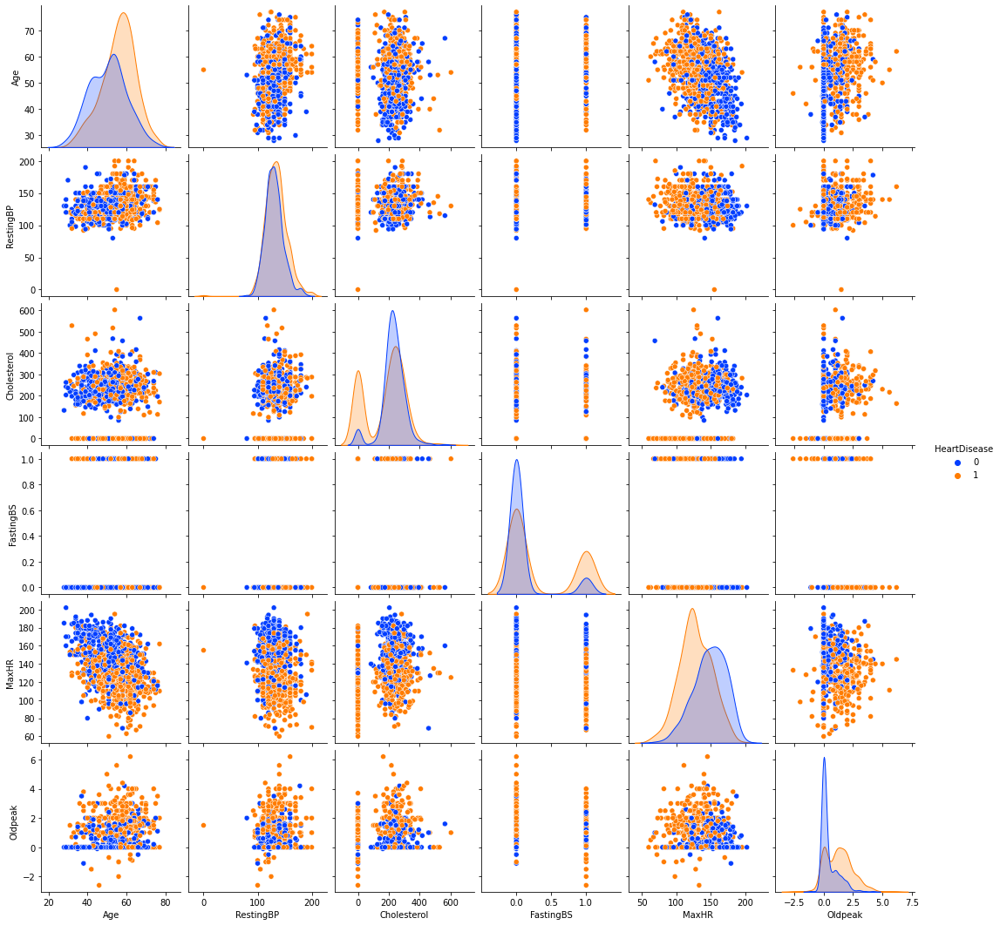

In [16]:
sns.pairplot(heart, hue="HeartDisease", palette="bright")

### Choice of covariates to investigate

We decided to analyse the relation between some clinical conditions and Heart Disesases with the ESL. We extract two of the variables available from the dataset that doctors usually point out as critical reasons for cardiovascular diseases. Moreover, their numerical nature allows us to draw distances between the two subsets of population to classify:

- Cholesterol: High and low values are always associated with heart diseases, such as atherosclerosis, resulting in a heart attack. We will explore this variable further because of inconsistencies within the dataset.
- Max Heart rate: Low maximum heart rates result from lack of exercise and unhealthy habits. Therefore, we will potentially see a relation between heart diseases and lower values in this covariate.

Text(0, 0.5, 'MaxHR')

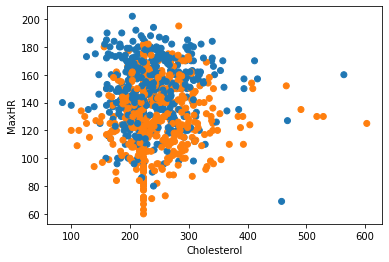

In [19]:
heart_int = heart[heart.describe().columns].drop(['FastingBS'],axis=1)

heart_int['Cholesterol'].mask(heart_int['Cholesterol']==0,heart_int['Cholesterol'].median(),inplace=True)

colors = ["tab:orange" if y_i == 1 else "tab:blue" for y_i in heart_int["HeartDisease"]]
f, a = plt.subplots()
a.scatter(heart_int["Cholesterol"], heart_int["MaxHR"], c=colors)
a.set_xlabel("Cholesterol")
a.set_ylabel("MaxHR")

When the dataset was loaded, we were aware of an unusual number of rows with 0 as their value for Cholesterol. Having no Cholesterol at all is not a reasonable value, and it is probably a result of missing values on the data gathering process, so we decided to impute the median to avoid its effect on the final modeling.

Even though the number of rows that had this issue represented around 20% of the dataset, the effect of the Cholesterol being 0 was still trackable, even with the median.

Text(0, 0.5, 'MaxHR')

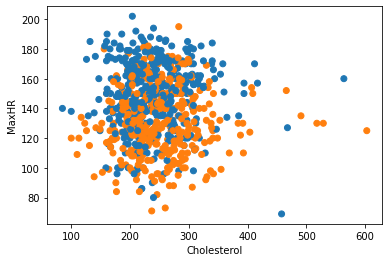

In [22]:
heart_int = heart_int[heart['Cholesterol']!=0][["Cholesterol","MaxHR","HeartDisease"]]
colors = ["tab:orange" if y_i == 1 else "tab:blue" for y_i in heart_int["HeartDisease"]]
f, a = plt.subplots()
a.scatter(heart_int["Cholesterol"], heart_int["MaxHR"], c=colors)
a.set_xlabel("Cholesterol")
a.set_ylabel("MaxHR")

Finally, we decided to discard the rows with this issue to prevent missclassification.

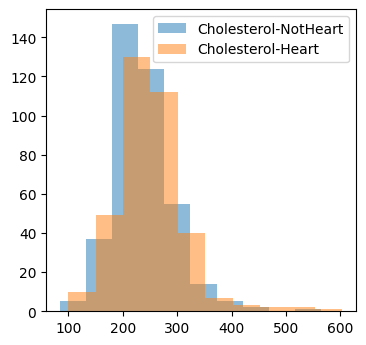

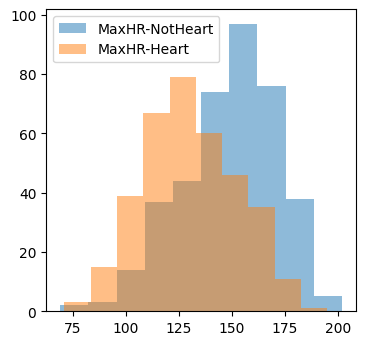

In [23]:
data =  [heart_int[heart_int["HeartDisease"]==0],heart_int[heart_int["HeartDisease"]==1]]
y_data = heart_int['HeartDisease']
plt.rcParams.update({'figure.figsize':(4,4), 'figure.dpi':100})
plt.hist(data[0]['Cholesterol'],label='Cholesterol-NotHeart',alpha=0.5)
plt.hist(data[1]['Cholesterol'],label='Cholesterol-Heart',alpha=0.5)
plt.legend()
plt.show()
plt.hist(data[0]['MaxHR'],label='MaxHR-NotHeart',alpha=0.5)
plt.hist(data[1]['MaxHR'],label='MaxHR-Heart',alpha=0.5)
plt.legend()
plt.show()

As we, and the medical community, suspected, the distributions of Cholesterol values indicate how high cholesterol values are generally a risk that can end with heart diseases. We also see how the hearts with the higher heart rates are generally healthier than those with lower values.

We see how the distributions between classification subsets are distinguishable on the edges, but clearly, there is overlap between them at the median values. Because of this, we expect the Elliptical Slice to fail generally to predict on median values, and perform better on the edges.


In [24]:
import pickle
DATADIR = os.path.join("data", "clean")

x_train = pd.read_pickle(os.path.join(DATADIR, "clean_x_train.pkl"))
x_test = pd.read_pickle(os.path.join(DATADIR, "clean_x_test.pkl"))
y_train = pd.read_pickle(os.path.join(DATADIR, "clean_y_train.pkl"))
y_test = pd.read_pickle(os.path.join(DATADIR, "clean_y_test.pkl"))

with open(os.path.join(DATADIR, "posterior_samples.pkl"), "rb") as infile:
    posterior_samples = pickle.load(infile)

with open(os.path.join(DATADIR, "prior_samples.pkl"), "rb") as infile:
    prior_samples = pickle.load(infile)

with open(os.path.join(DATADIR, "posterior_samples_fitted.pkl"), "rb") as infile:
    fitted_samples = pickle.load(infile)

with open(os.path.join(DATADIR, "posterior_predict_samples.pkl"), "rb") as infile:
    predicted_samples = pickle.load(infile)

with open(os.path.join(DATADIR, "model2.111trained.pkl"), "rb") as infile:
    predicted_samples = pickle.load(infile)

dim0_label = "Cholesterol"
dim1_label = "MaxHR"

### Kernel and final model parameters
We decide to use a gaussian + white noise kernel for the slicer, with initial hyperparameters $\theta_{gauss}=[1,1]$, $\theta_{wn}=[1]$.

In [ ]:
tol2 = 1e-1
eps2 = 1
gpc2 = GPC(gaussian_white_noise_kernel, [1,1,1])
gpc2.fit(x, y, verbose=1, tol=tol2, eps=eps2)

Neg log likelihood is 174.07466589326913
Neg log likelihood is 172.00858375684254
Neg log likelihood is 187.0344720448313
Neg log likelihood is 193.75613637183775
Neg log likelihood is 176.6772482969173
Neg log likelihood is 176.8672580223586
Neg log likelihood is 180.44379422527493
Neg log likelihood is 185.45400325791013
Neg log likelihood is 190.5032156917041
Neg log likelihood is 175.8765458675715
Neg log likelihood is 186.0416313627562
Neg log likelihood is 194.8264746107957
Neg log likelihood is 178.68285199002983
Neg log likelihood is 171.0143718753095
Neg log likelihood is 186.29250771736483
Neg log likelihood is 185.99086876175744
Neg log likelihood is 181.79697696863082
Neg log likelihood is 174.44784438224565
Neg log likelihood is 181.18844579403859
Neg log likelihood is 196.22126719036527
Neg log likelihood is 186.62277858117233
Neg log likelihood is 170.9419837331116
Neg log likelihood is 184.99806900989174
Neg log likelihood is 191.07003600412318
Neg log likelihood is 181

The final hyperparameters and the negative log likelihood are the following:

In [33]:
print("Neg. log likelihood: "+str(gpc2.nll))
print("Hyperparameters both kernels: "+str(gpc2.hyperparameters))

Neg. log likelihood: 155.93161251272605
Hyperparameters both kernels: [11.16932818  1.56970289  0.11976254]


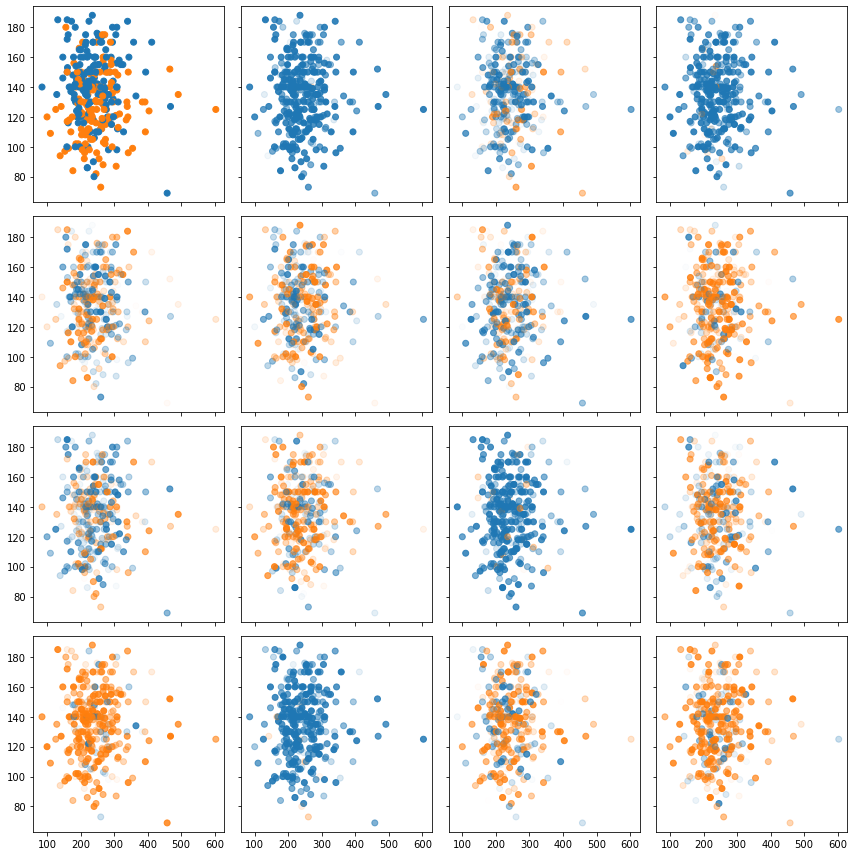

In [34]:
prior_comparison = compare_samples_with_original(x_train, y_train, prior_samples, plot_proba = True)

One of the methods mentioned in the Gelman book is to just visualize posterior draws and see how well they fit our true data. This is what we have done here. We note that a multivariate normal does poorly at fitting the data since it is very inconsistent. A strong domination of one class or the other and we don't observe a separation that we do observe in the true case.

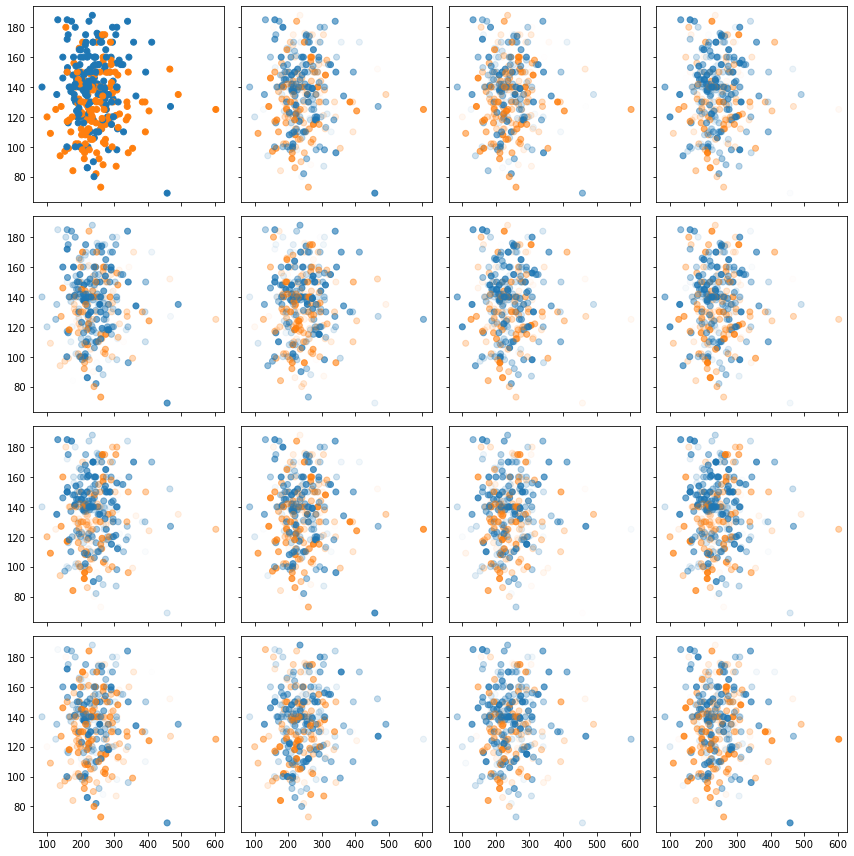

In [35]:
posterior_comparison = compare_samples_with_original(x_train, y_train, posterior_samples, plot_proba = True)

When we sample from the posterior, we note that the GP has fit the model much better than the prior but again it is not great. These two cases correspond to the uninformative priors. We also have the function parameter called plot_proba which assigns a transparency to probabilities close to 0.5, which would be bad predictions. 

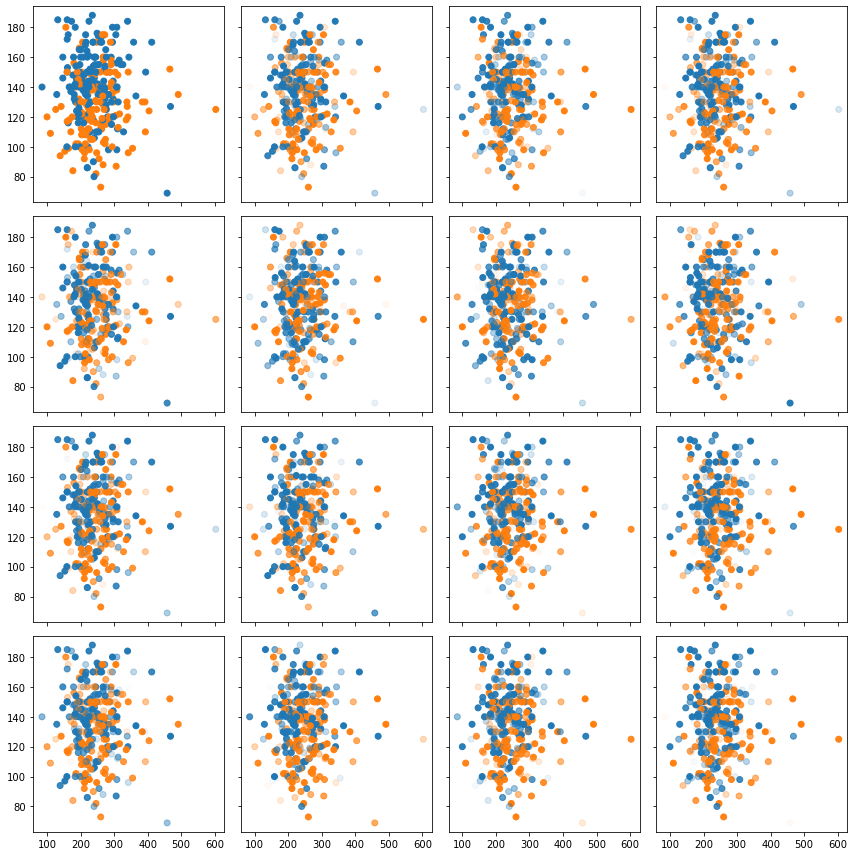

In [36]:
fitted_comparison = compare_samples_with_original(x_train, y_train, fitted_samples, plot_proba=True)

Once we fit our kernel hyperparameters to our model we notice a much better fit. We also note that probabilities are further away from 0.5 in general

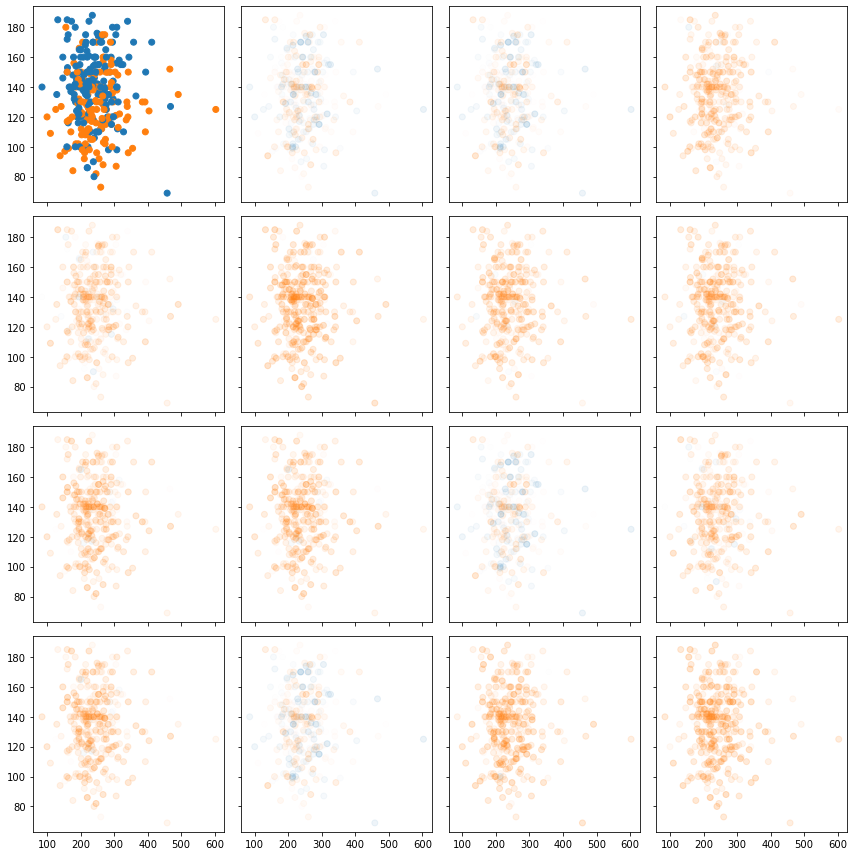

In [37]:
prior_mean_fig = plot_mean_samples(x_train, y_train, prior_samples)

Above we plot the mean of a bootstrap of the prior (MVN) and below we plot the same but for posterior draws. The mean behaves, in general, better than simple draws, which is expected.

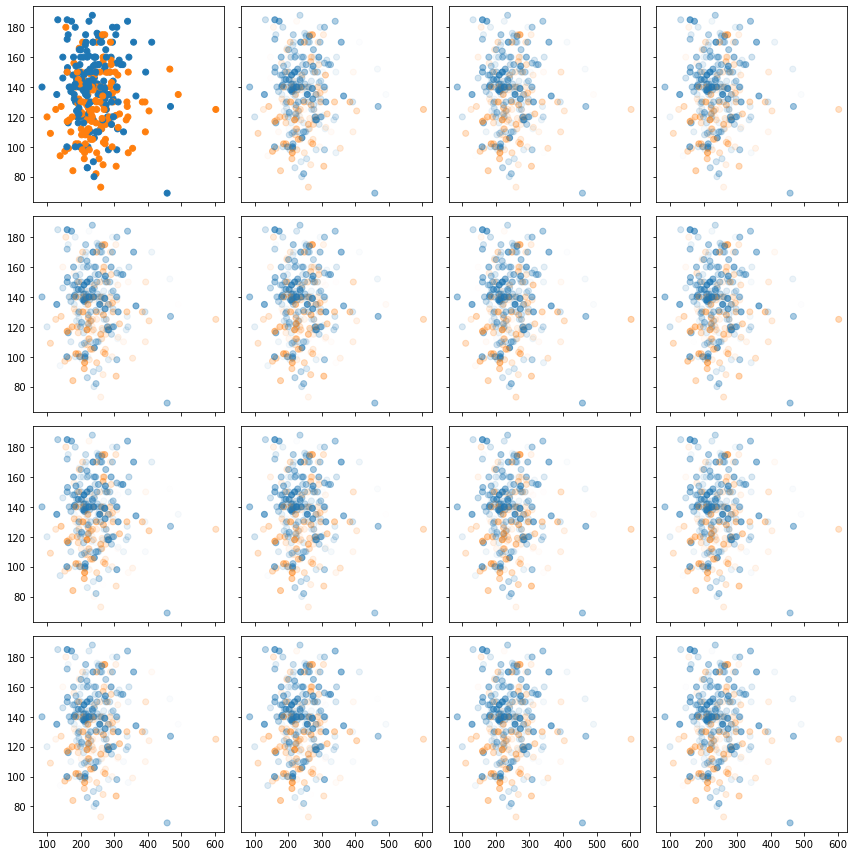

In [38]:
posterior_mean_fig = plot_mean_samples(x_train, y_train, posterior_samples, plot_proba=True)

We use the same treatment but now for the fitted hyperparameters of the kernel. We note that this is a huge improvement from before. It is worth it to fit hyperparameters.

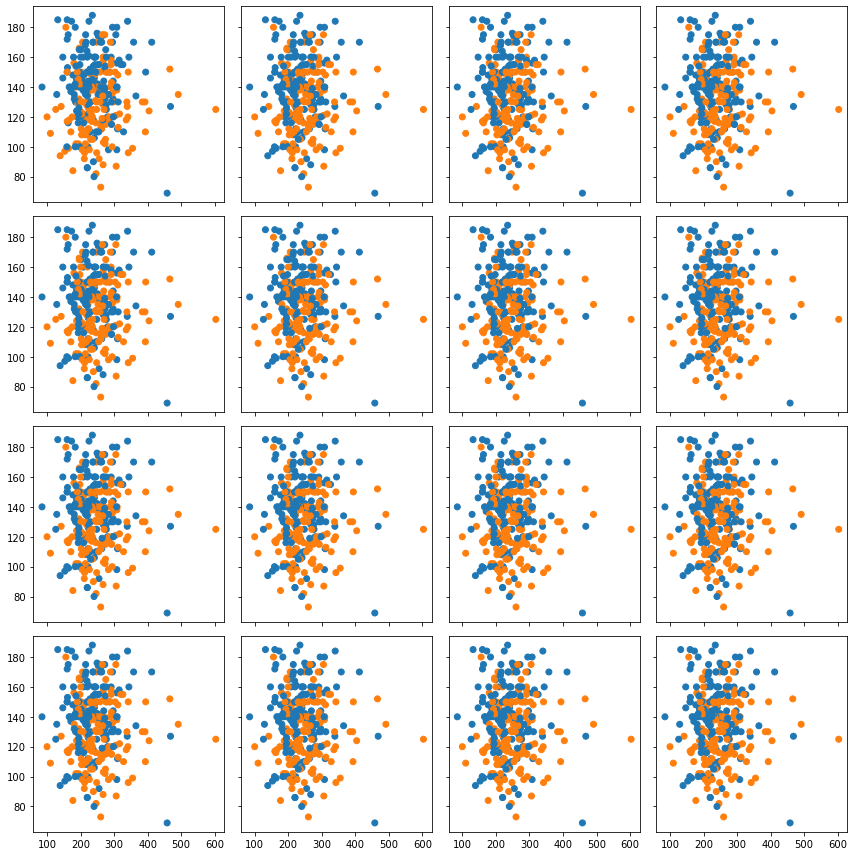

In [ ]:
fitted_mean_fig = plot_mean_samples(x_train, y_train, fitted_samples, plot_proba=False)

Here we visualize how the draws behave.

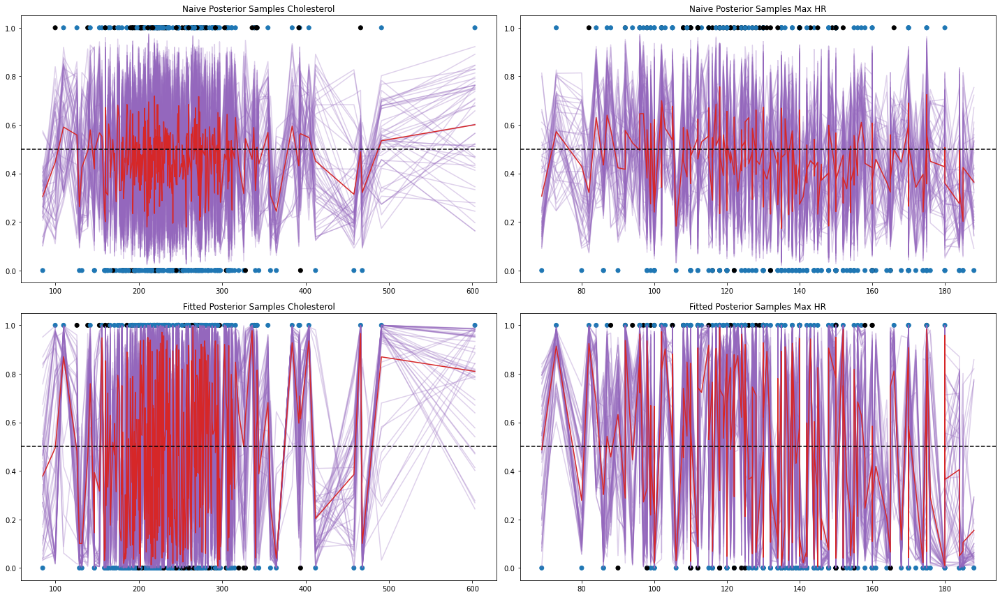

In [ ]:
titles = [" ".join(strings) for strings in itertools.product(["Naive Posterior Samples", "Fitted Posterior Samples"], ["Cholesterol", "Max HR"])]
fig, axs = plt.subplots(2, 2, figsize=(20, 12), tight_layout=True)
for (sample, dim), title, ax in zip(itertools.product([posterior_samples, fitted_samples], [0, 1]), titles, axs.ravel()):
    plot_1d(dim, x_train, y_train, sample, ax, title=title)

Here we take a look at our predictions for the test set. We plot a couple point predictions by taking a 200 draws from the fitted posterior and taking their mean. Notice here that the predictions are not actually that good. We make many wrong predictions and it is not uncertain as much as we would like when it is wrong.

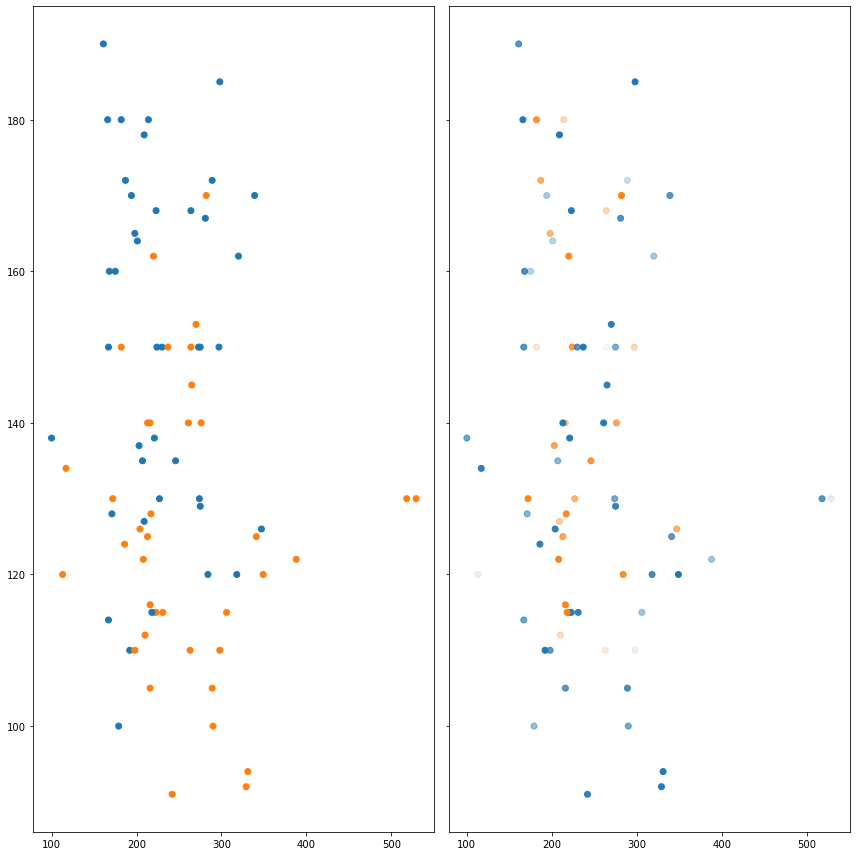

In [39]:
predictions = predicted_samples[:,len(x_train):]
predictions_fig = plot_mean_samples(x_test, y_test, predictions, sample_size=200, nrow=1, ncol=2)

Here we plot the posterior predictions against each axis univariately to try to get a better idea. We can see here that the model is simply fairly uncertain for a lot of the predictions. This would indicate that we woulld want to rethink about our modelling choices by choosing a kernel or combination of kernels that could better deal with the high degree of overlap in the two classes and the central noisy regions, because although the problem is hard to predict, there is a clear structure when considering these two features of the data together and the model, although able to fit it in the training data is unable to prevent itself from overfitting because it is unable to quantify the right amount of noise through the white noise kernel as we had hoped. We would also want to find more features that could give us better separation in the data to make the problem easier. 

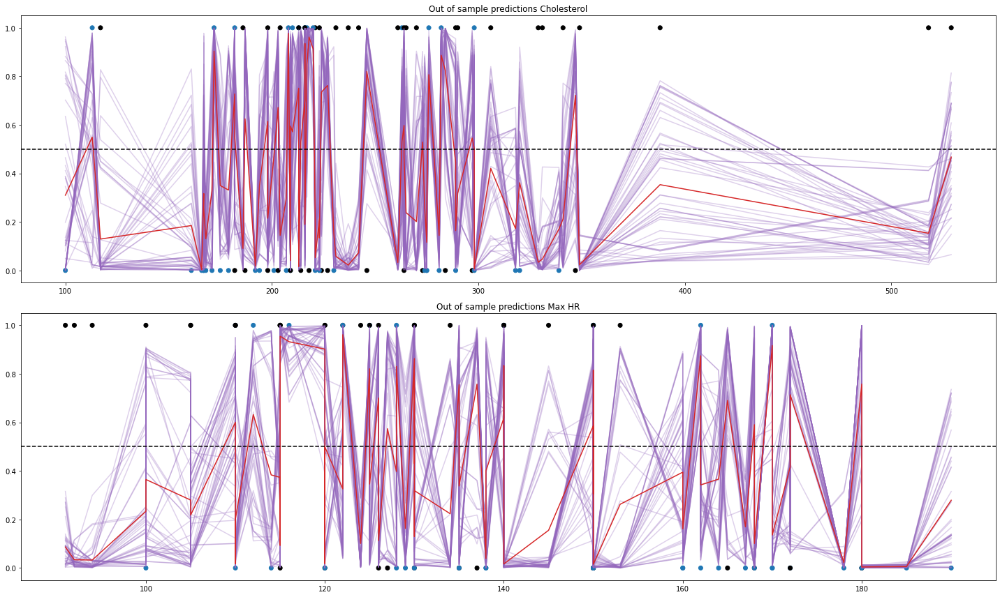

In [40]:
titles = [" ".join(strings) for strings in itertools.product(["Out of sample predictions"], ["Cholesterol", "Max HR"])]
fig, axs = plt.subplots(2, 1, figsize=(20, 12), tight_layout=True)
for (sample, dim), title, ax in zip(itertools.product([predictions], [0, 1]), titles, axs.ravel()):
    plot_1d(dim, x_test, y_test, sample, ax, title=title)
    

In [5]:
from EllipticalSliceSampler import EllipticalSampler
from gpc import GPC
from utils import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pickle
import seaborn as sns
import pandas as pd
DATAPATH = "data"
heart = pd.read_csv(os.path.join(DATAPATH,"heart.csv"))
heart
heart_int = heart[heart.describe().columns].drop(['FastingBS'],axis=1)
heart_int = heart_int[heart_int['Cholesterol']!=0][["Cholesterol","MaxHR","HeartDisease"]]
y = heart_int['HeartDisease'][0:400]

X = heart_int[["Cholesterol","MaxHR"]][0:400].values

x, x_test, y, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [3]:
file = open(b"data/clean/model2.111trained.pkl","rb")
gpc2 = pickle.load(file)

file2 = open(b"data/clean/posterior_predict_samples.pkl","rb")
posterior_predict_samples = pickle.load(file2)

file3 = open(b"data/clean/posterior_samples.pkl","rb")
posterior_samples = pickle.load(file3)

file4 = open(b"data/clean/posterior_samples_fitted.pkl","rb")
posterior_samples_fitted = pickle.load(file4)

file5 = open(b"data/clean/prior_samples.pkl","rb")
prior_samples = pickle.load(file5)

file6 = open(b"data/clean/clean_x_test.pkl","rb")
x_test = pickle.load(file6)

file7 = open(b"data/clean/clean_x_train.pkl","rb")
x = pickle.load(file7)

file8 = open(b"data/clean/clean_y_test.pkl","rb")
y_test = pickle.load(file8)

file9 = open(b"data/clean/clean_y_train.pkl","rb")
y = pickle.load(file9)

[]

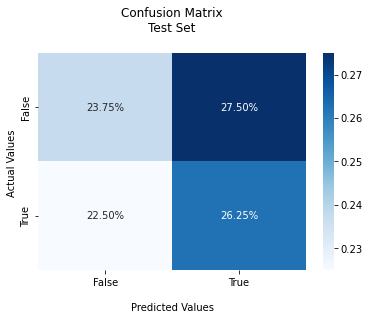

In [6]:
from sklearn.metrics import accuracy_score, confusion_matrix
predictions = gpc2.predict(x_test)
pred = np.round(1/(1+np.exp(predictions[0])))

cf_matrix = confusion_matrix(y_true=np.array(y_test),y_pred=pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix),fmt='.2%',annot=True,cmap='Blues')

ax.set_title('Confusion Matrix\nTest Set\n')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ')

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

ax.plot()

[]

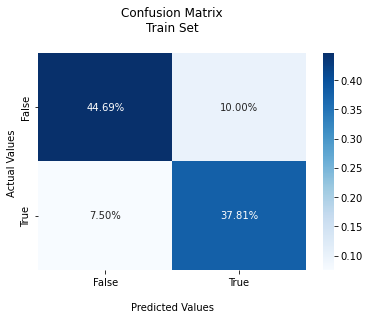

In [ ]:
pred = np.round(sigmoid(posterior_samples_fitted.mean(axis=0)))

cf_matrix = confusion_matrix(y_true=np.array(y),y_pred=pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix),fmt='.2%',annot=True,cmap='Blues')

ax.set_title('Confusion Matrix\nTrain Set\n')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ')

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

ax.plot()

We note that the fitted model performs much better than the simple GP model. It is actualy usable since the previous confusion matrix shows that we are missclassifying an important portion of the data. 

In [52]:
posterior_mean = np.mean(posterior_samples, axis = 1)
posterior_fit_mean = np.mean(posterior_samples_fitted,  axis = 1)

posterior_AIC = AIC(posterior_mean, y)
posterior_fit_AIC = AIC(posterior_fit_mean, y)

posterior_BIC = BIC(posterior_mean, y)
posterior_fit_BIC = BIC(posterior_fit_mean, y)

posterior_WAIC = WAIC(y, posterior_samples)
posterior_fit_WAIC = WAIC(y, posterior_samples_fitted)

In [55]:
print("AIC for prior hyperparameters: " + str(posterior_AIC))
print("BIC for prior hyperparameters: " + str(posterior_BIC))
print("WAIC for prior hyperparameters: " + str(posterior_WAIC))

print("AIC for fitted hyperparameters: " + str(posterior_fit_AIC))
print("BIC for fitted hyperparameters: " + str(posterior_fit_BIC))
print("WAIC for fitted hyperparameters: " + str(posterior_fit_WAIC))

AIC for prior hyperparameters: 225.0644861157812
BIC for prior hyperparameters: 232.60112810736874
WAIC for prior hyperparameters: 46.12251352555177
AIC for fitted hyperparameters: 224.747770077136
BIC for fitted hyperparameters: 232.28441206872355
WAIC for fitted hyperparameters: 131.02657131048164


Here we note the for information criteria the AIC and BIC are very similar for the mean posterior but the WAIC is very different. Its surprising since all other test show thata the fitted model preforms much better. Here we may use common sense and conclude that the fitted model performs better even though the WAIC is much higher for this model. It is clear that the fitted model provides a strong advantage.

We don't choose the fitted model and stop, we need to understand where our model fails and see if we can improve on it. This is out of the scope of this project so the recommendation is to include more variables into the model since we are only using 2. Other improvements include: better kernel selection, more informative data cleaning (imputer), better understanding of the problem at hand (doctor's perspective) and possibly encoding a hierarchy for categorical values (such as the pain scale).